# Imports

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


<hr>

# Q1)

## 1.1

* The chroma_key function takes in an fg image, a bg image, a green threshold, and a filename as input
* The function then creates a mask which is 1 wherever the fg has a green screen, and 0 otherwise
* The mask is then used to create the final image by multiplying the fg intensities with the mask, and adding that to the image obtained by multiplying the inverse of the mask with the bg

In [2]:
def chroma_key(fg, bg, gthres, fname="greenscreen_1"):

    fg = cv.resize(fg, bg.shape[:2][::-1])

    mask = (fg[:,:,1] > gthres) & (fg[:,:,2] < 200) & (fg[:,:,0] < 200)
    mask = np.dstack([mask,mask,mask]).astype('uint8')

    final = mask * bg + (np.logical_not(mask)) * fg
    
    fig = plt.figure(figsize=(15,15))
    plt.imshow(final)
    plt.imsave("../images/"+fname+".png", final)
    

### 1.1.a
* This applies chroma_keying to `fg.jpg` and `bg.jpg`
* After experimenting, a green threshold of 150 worked best

In [3]:
im1 = cv.imread("../images/fg.jpg")
im1 = cv.cvtColor(im1, cv.COLOR_BGR2RGB)
im2 = cv.imread("../images/bg.jpg")
im2 = cv.cvtColor(im2, cv.COLOR_BGR2RGB)

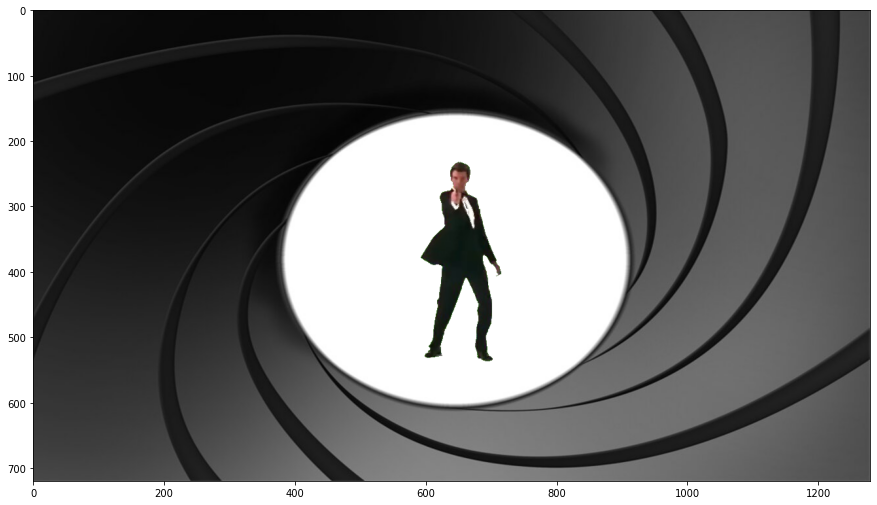

In [4]:
chroma_key(im1, im2, 150, "greenscreen_1.1")

<hr>

### 1.1.b
* This applies `chroma_key()` to `fg.jpg` and `mansion.jpg`
* After experimenting, a green threshold of 150 worked best

In [5]:
mansion = cv.imread('../images/mansion.jpg')
mansion = cv.cvtColor(mansion, cv.COLOR_BGR2RGB)

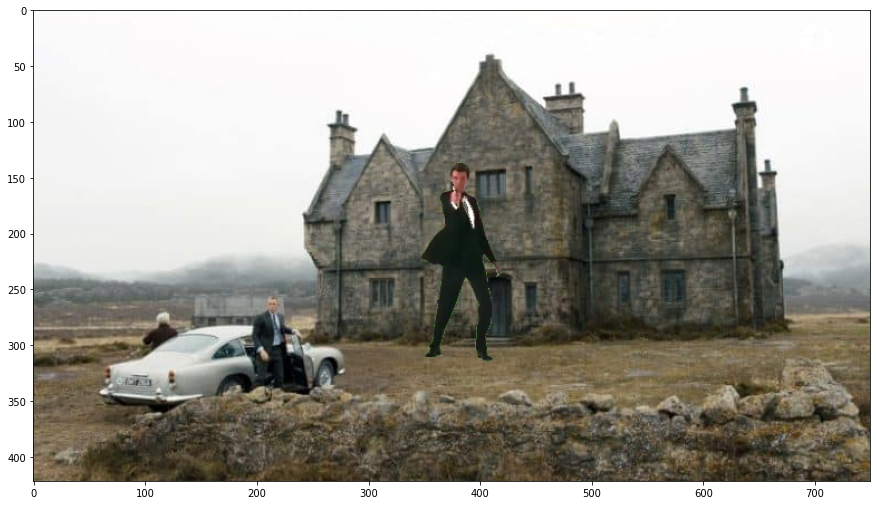

In [6]:
chroma_key(im1, mansion, 150, "mansion_bond")

<hr>

### 1.1.c
* This applies `chroma_key()` to `baby_ahish.png` and `custom_bg_1.png`
* After experimenting, a green threshold of 195 worked best

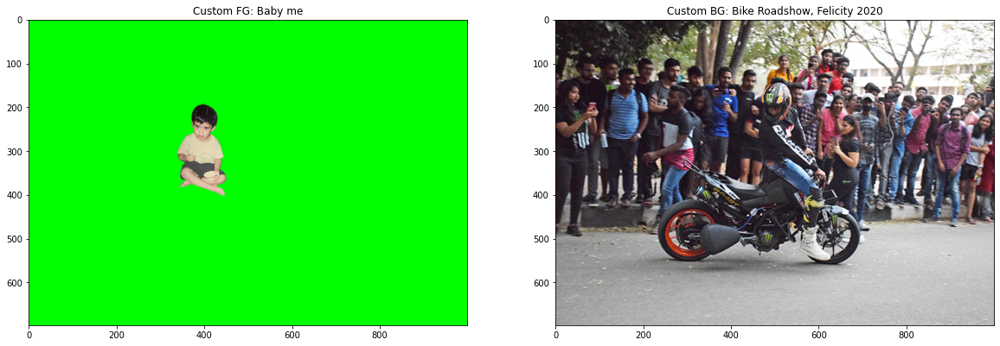

In [7]:
custom_bg = cv.imread('../images/custom_bg_1.png')
custom_bg = cv.cvtColor(custom_bg, cv.COLOR_BGR2RGB)
custom_fg = cv.imread('../images/custom_fg.png')
custom_fg = cv.cvtColor(custom_fg, cv.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.title('Custom FG: Baby me')
plt.imshow(custom_fg)
plt.subplot(122)
plt.title('Custom BG: Bike Roadshow, Felicity 2020')
plt.imshow(custom_bg)

Applying `chroma_key()`,

Text(0.5, 1.0, 'Baby Ahish in Bike Stunt Show at Felicity 2020')

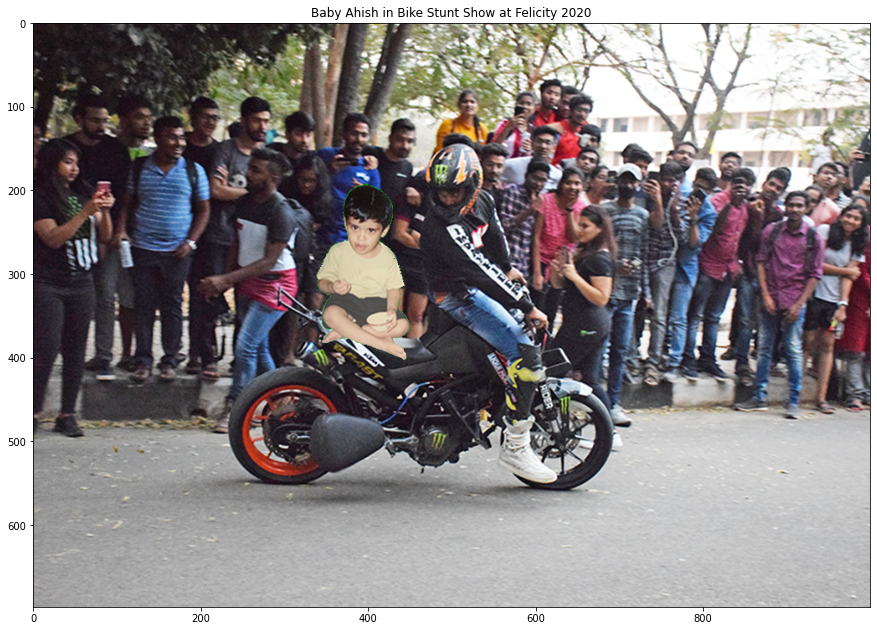

In [8]:
chroma_key(custom_fg, custom_bg, 195, "custom_chrome_keying")
plt.title("Baby Ahish in Bike Stunt Show at Felicity 2020")

<hr>

# Q1.2

Given,
* Maximum storage size = **4GB**
* Images are **RGB** with a size of **1280x720**

#### Representing 4GB in bytes,

In [9]:
max_size = 4*(1024*1024*1024) #bytes
print("4GB in bytes =", max_size, "bytes")

4GB in bytes = 4294967296 bytes


#### Calculating number of bytes each image takes
* Each pixel has `3` channels
    * Each channel has an `8-bit`, ie. `1-byte` unsigned integer 
* An `AxB` image has `A*B` pixels

Thus, T, the total number of bytes taken per image, is given by, 
\begin{equation}
    T = A*B*3*1
\end{equation}

In [10]:
n_pixels = 1280*720
img_bytes = n_pixels*3
print("Total number of bytes per image =", img_bytes)

Total number of bytes per image = 2764800


#### Total number of images that can be stored
* This is simply the total number of bytes that can be stored divided by the bytes taken by 1 image

In [11]:
total = int(max_size/img_bytes)
print("Thus, Total number of images that can be stored =", total)

Thus, Total number of images that can be stored = 1553


<hr>

# Q2)
Given, 
* Image size is **168.75MB**
* The image is a square, color image
    * Since it's square, height = width

#### Converting given image size to bytes
* Conversion from MB to bytes:
    * 1 MB = 1024 KB
    * 1 KB = 1024 bytes
    * Thus, 1 MB = $1024*1024$ bytes
    
Applying this below,

In [12]:
img_size = int(168.75*(1024*1024)) #bytes
print("The images size in bytes =", img_size)

The images size in bytes = 176947200


#### Calculating total pixels in the image
* Each pixel has `3` channels
    * Each channel has 1 `8-bit` unsigned integer
* `Total Number of Pixels = Full Image Size / Each Pixel Size`

In [13]:
pixel_bytes = 1*3 #bytes
total_pixels = int(img_size/pixel_bytes)

print("Total number of pixels =", total_pixels)

Total number of pixels = 58982400


#### Given the image is square
* We can take square root of total pixels to find `width` & `height`

In [14]:
w = h = np.sqrt(total_pixels)
print("Height of the image is: ", h, "pixels")
print("Width of the image is: ", w, "pixels")

Height of the image is:  7680.0 pixels
Width of the image is:  7680.0 pixels


<hr>

# Q3)
Given,
* Height of insignia, $t = 32.8cm$
* CCD Sensor dimensions = $10mm * 10mm$
* CCD Sensor no. of pixels = $1024*1024$
* Focal length of the camera, $f = 6.25cm$
* Insignia must cover atleast 50 pixels on the CCD sensor

In [15]:
h_object = 32.8 #cm
f = 6.25 #cm

#### Calculating required image height
* We know that we need the image must cover 50 pixels on the sensor
* Now, we know that there are 1024 pixels in 1 dimension fit into 10mm
    * Thus, 1 pixel occupies $\frac{10}{1024}$mm on the sensor
    * Hence, 50 pixels would occupy $50*\frac{10}{1024}$mm on the sensor

Performing the above mentioned calculations,

In [16]:
cm_per_pixel = 1/1024
h_image = 50*cm_per_pixel
print("Required image height(on the sensor) = "+str(h_image)+"cm")

Required image height(on the sensor) = 0.048828125cm


#### Using lens formula

* $\frac{v}{u} = \frac{h_i}{h_o}$
* $u = \frac{v*h_o}{h_i}$,
        where u   = object distance,
              v   = image distance,
              h_i = Image height,
              h_o = Object height
* We know that:
    * $v = f$, as the image is formed on the focus of the lens, to get the most minimal size of sensor possible
    * $h_o$ is given
    * $h_i$ is calculated above
    
Substituting in the lens formula,

In [17]:
u = f * h_object/h_image
print("Required distance = "+str(int(u))+"cm")
print("Required distance after rounding = "+str(round(u/100))+"m")

Required distance = 4198cm
Required distance after rounding = 42m


<hr>

# Q4)

## 4.1

All the required functions are defined below


#### `bitQuantizeImage()` 
* This function takes in 2 arguments, the image and 'k'
* Since the image has to be transformed to have a maximum of $2^k$ discrete intensities, we use the following steps:
    * Calculate number of discrete levels with `n_divs` = $2^k$
    * Now, as the input image has intensities ranging from 0-255, we calculate a value `fac`, which would give values from $0$ to $2^k-1$ on dividing the pixel intensities by it
    * Now, to get the quantized values scaled up to be in the range 0-255, we simply create an array of $2^k$ equally spaced integers from 0-255
    * We define a 1-1 mapping from ($0$ to $2^k-1$) to the array created in the above step
    * We simply apply the mapping and get our required image
  

In [18]:
def bitQuantizeImage(im, k, show=True):
    n_divs = 2**k
    fac = round(255/n_divs)
    val_map = np.linspace(0,255,n_divs).astype(int)
    im = (im//fac)
    f = np.vectorize(lambda x : val_map[x])
    im = f(im)
    
    if show:
        plt.imshow(im, cmap="gray")
        plt.imsave("../images/bitquantize_"+str(k)+".png", im, cmap="gray")
    return im.astype('uint8')

#### `show_all_quants()`
* This function calls `bitQuantizeImage()` to generate the quantized images for different values of `k`

In [19]:
def show_all_quants(im): 

    fig = plt.figure(figsize = (20,15))
    for k in range(1,9):
        plt.subplot(4,4,k)
        plt.title("k = "+str(k))
        bitQuantizeImage(im, k)
        

#### `get_bitplane()`
* This function gets the required bitplane specified by the parameter `k`, which gets the $k^{th}$ bit plane
* It does this by applying logical `&` to the image with a mask defined by `1 << k`
    * `1 << k` simply sets the bit on the $k^{th}$ position while leaving the rest as 0

In [20]:
def get_bitplane(im, k):
    return im & (1 << k)

#### `show_bitplane()`
* Calls `get_bitplane()` for various values of `k` and plots the output

In [21]:
def show_bitplane(im, n_bits):
    
    fig = plt.figure(figsize = (20,17))
    for k in range(0,n_bits):
        plt.subplot(n_bits//2,n_bits//2,k+1)
        plt.title("Bit plane: "+str(k))
        im_b = im & (1 << k)
        
        plt.imshow(im_b, cmap="gray")
        plt.imsave("../images/007_bitplane-"+str(k)+".png", im_b, cmap="gray")

<hr>

## 4.2

* Reads the `007_test1.png` image and uses the `show_all_quants()` function defined above to show the various outputs for quantization

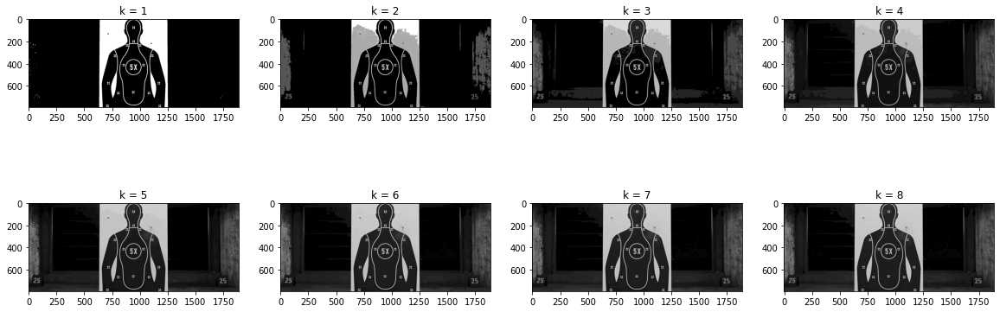

In [22]:
t1 = cv.imread("../images/007_test1.png", cv.IMREAD_GRAYSCALE)

show_all_quants(t1)

<hr>

## 4.3

* Reads the `007_test2.png` image and uses the `show_bitplane()` function defined above to show the various outputs for bitplaning

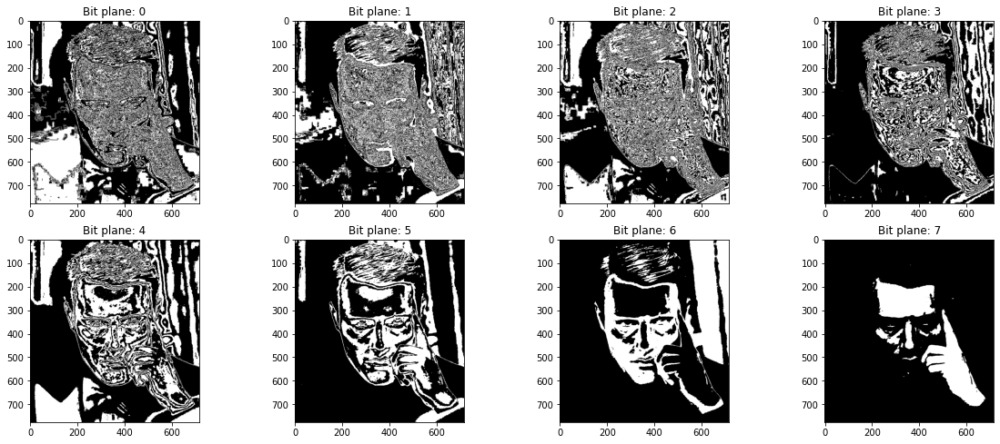

In [23]:
t2 = cv.imread("../images/007_test2.png", cv.IMREAD_GRAYSCALE)

show_bitplane(t2, 8)

<hr>

## 4.4

Finds `k` value for my roll number

In [24]:
k = 2018102022 % 5
print("k =", k, "for roll number 2018102022")

k = 2 for roll number 2018102022


Reading `mallory.jpg` and `mallory_corrupt.jpg` as required for my roll number:

In [25]:
mallory = cv.imread("../images/mallory.jpg", cv.IMREAD_GRAYSCALE)
mallory_corrupt = cv.imread("../images/mallory_corrupt.jpg", cv.IMREAD_GRAYSCALE)

Displaying `mallory.jpg` and `mallory_corrupt.jpg`:

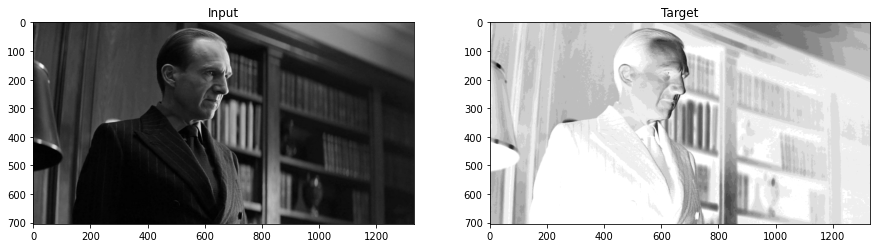

In [26]:
fig = plt.figure(figsize=(15,10))
plt.subplot(121)
plt.title("Input")
plt.imshow(mallory, cmap="gray")
plt.subplot(122)
plt.title("Target")
plt.imshow(mallory_corrupt, cmap="gray")

### Transforms done to the original image:
* The image's colors are first inverted using `img = 255 - img`
* Then, after a bit of trial and error, it was found that quantizing with `k = 4` matched the corrupted image very well
* It was also noticed that the intensities of the transformed image were all slightly lower than that in the corrupted image, and hence an offset was added 
    * It was ensured that there were no overflows by first converting the img to `int`, applying the offset and clipping, and then converting back to `uint8`

### Error Calculation
* Error was calculated by subtracting the expected output and the output of transforming the image
* The mean of the absolute value of the individual errors was calculated

In [27]:
# Step - 1
mallory_inv = 255-mallory
# Step - 2
mallory_op1 = bitQuantizeImage(mallory_inv, 4, False)
# Step - 3
mallory_op1 = (np.clip(mallory_op1.astype('int') + 4, 0, 255)).astype('uint8')

# Error Calculation
error = mallory_corrupt.astype('int')-mallory_op1.astype('int')
print("Average Difference =", np.mean(np.abs(error)))
print("Max + diff: ", np.max(error))
print("Max - diff: ", np.min(error))
print("Diff = "+str(np.mean(np.abs(error))*100/255)+"%")

Average Difference = 1.7816743130265198
Max + diff:  16
Max - diff:  -11
Diff = 0.6986958090300077%


### Plotting

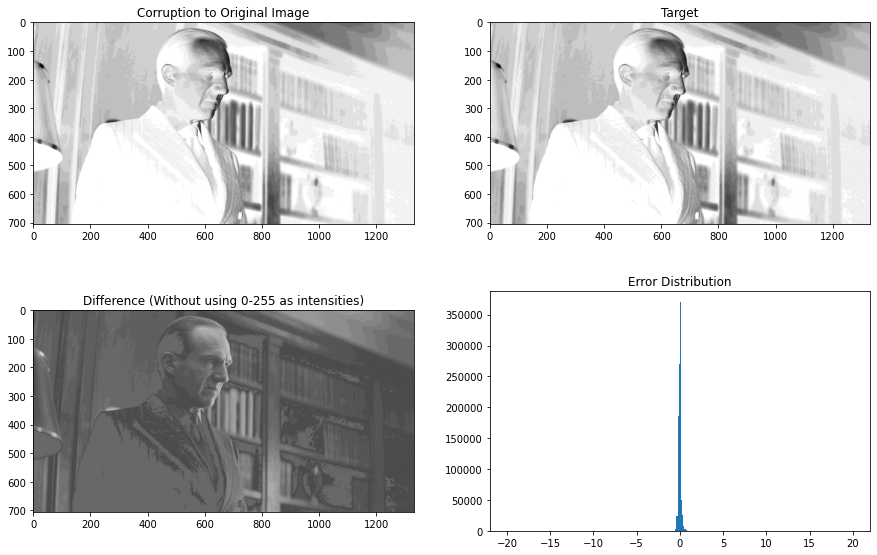

In [28]:
fig = plt.figure(figsize=(15,15))

plt.subplot(321)
plt.title("Corruption to Original Image")
plt.imshow(mallory_op1, cmap="gray", vmin=0, vmax=255)

plt.subplot(322)
plt.title("Target")
plt.imshow(mallory_corrupt, cmap="gray")

plt.subplot(323)
plt.title("Difference (Without using 0-255 as intensities)")
plt.imshow(error, cmap="gray")

plt.subplot(324)
plt.title("Error Distribution")
plt.hist((error.flatten()/np.max(error)), range=(-20,20), bins=300)

plt.imsave("../images/mallory_corruption_output.png", mallory_op1, cmap="gray")

print()

<hr>

# Q5)

Loading the input image,

#### The following formula is used for contrast stretching:
\begin{equation}
I_{out} = a + ({I}_{in} - c)*\frac{(b-a)}{(c-d)},
where \\
c = min(I_{in}),\\
d = max(I_{in})
\end{equation}

#### `linContrastStretching()`
* The function takes in the image, parameters $a$ and $b$ as input
* It first calculates $c$ and $d$ as defined in the above formula after converting the image to be of type `int`
* The function then applies the formula mentioned above to the pixels in the image, and clips them if they exceed the range

In [29]:
def linContrastStretching(im, a, b, show=True):
    
    im = im.astype('int32')
    c,d = np.min(im), np.max(im)
    
    im_out = np.clip(a + (((b-a)*(im-c))/(d-c)), 0, 255).astype('uint8')

    if show:
        plt.imshow(im_out, cmap='gray', vmin=0, vmax=255)
    return im_out.astype('uint8')

#### `get_histogram()`
* Helper function to plot the histogram

In [30]:
def get_histogram(im):
    plt.hist(im.flatten(), bins=256)

Reads the input image:

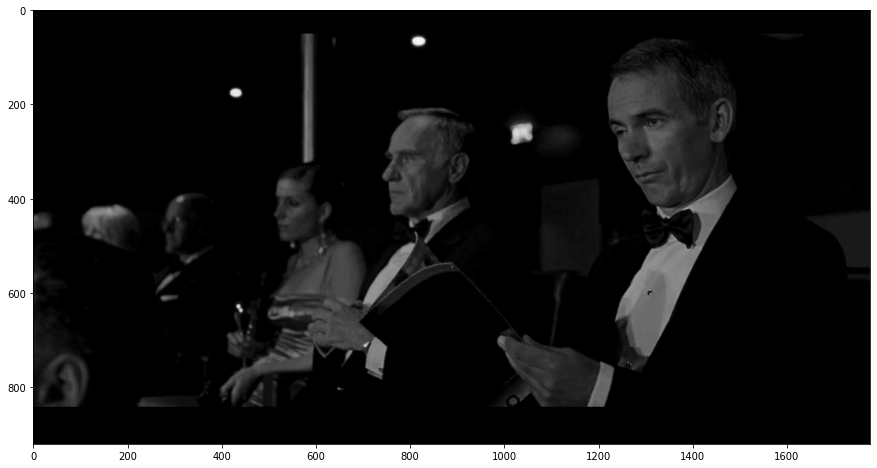

In [31]:
contrast_inp = cv.imread("../images/quantum_bad.jpg", cv.IMREAD_GRAYSCALE)
fig = plt.figure(figsize=(15,15))
plt.imshow(contrast_inp, cmap="gray")

### Applies contrast stretching and plots the output

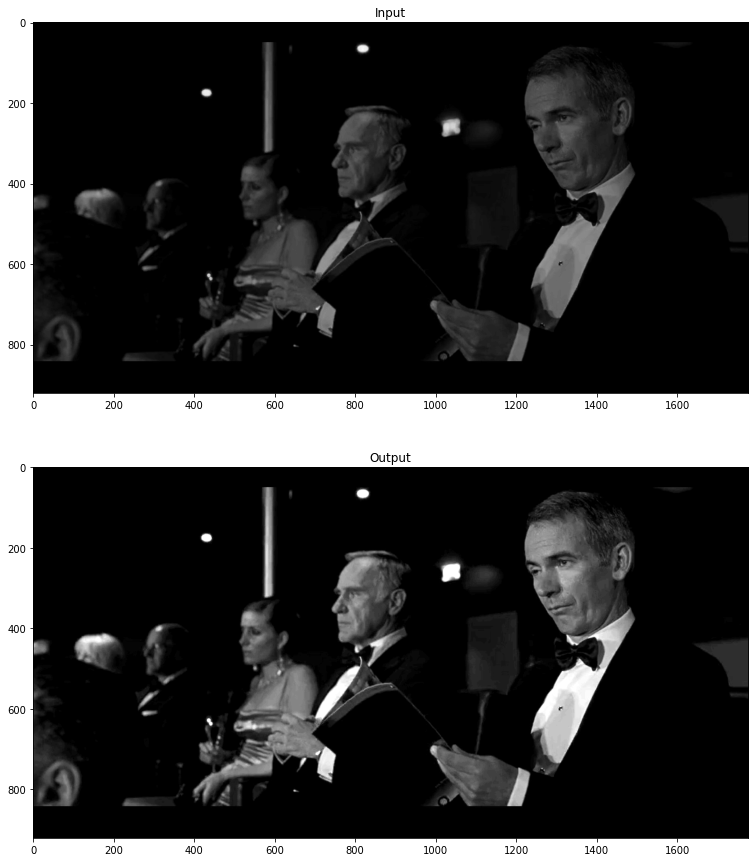

In [32]:
im_out = linContrastStretching(contrast_inp, 20, 450, show=False)

plt.imsave("../images/q5-contrast-stretching-output.png", im_out, cmap="gray")

fig = plt.figure(figsize=(15,15))
plt.subplot(211)
plt.title("Input")
plt.imshow(contrast_inp, cmap="gray")

plt.subplot(212)
plt.title("Output")
plt.imshow(im_out, cmap="gray")

### Plots the histograms of the input and output

Text(0.5, 1.0, 'Output Image Histogram')

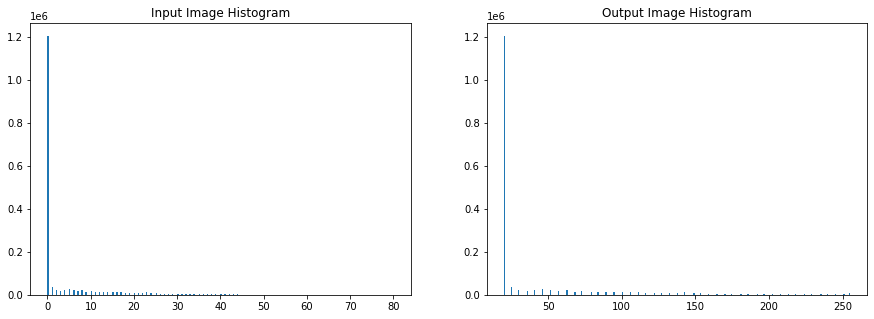

In [33]:
fig = plt.figure(figsize=(15,5))
plt.subplot(121)
get_histogram(contrast_inp)
plt.title('Input Image Histogram')
plt.subplot(122)
get_histogram(im_out)
plt.title('Output Image Histogram')

<hr>

# Q6)

## 6.1
`Function to perform Histogram Equalization`

### Equations used for Histogram Equalization

The equation used for Histogram Equalization on an input image $r$ to give output $s$ is,

\begin{equation}
    s(x) = round( (L-1)*\sum_{i=0}^{x}p_r(i))
\end{equation}
where $p_r(i)$ is the probability of finding the intensity $i$ in the input image, \
ie. $p_r(i)$ = Number of Pixels in the Input Image having Intensity $i$ / Number of Pixels in the Image


### `histEqualization()` 
* This function applies the equations descibed above
* `hist` gets the histogram of the image
* `csum` is a variable to calculate the $\sum_{i=0}^{x}p_r(i))$ dynamically
* `mp` is used to store the mapping

### `getHist()`
* This is a helper function to get the histogram of the image

In [34]:
def getHist(im):
    
    hist = np.array([0. for i in range(256)])
    mn = im.shape[0]*im.shape[1]
    for i in im.flatten():
        hist[i]+=1
    return hist/mn
    
def histEqualization(im):
    
    hist = getHist(im)
    
    s = im.copy()
    mp = [0 for i in range(256)]
    csum = 0
    for r in range(256):
        csum += hist[r]
        mp[r] = int(round((256-1)*csum))
        
    equalize = np.vectorize(lambda t : mp[t])
    s = equalize(s)
    
    return s, mp

## 6.2
`Function to perform Histogram Matching`

### Equations used for Histogram Matching

Let's consider two images, `img` and `ref`, where we want to match `img`'s histogram to that of `ref`

We first get the equalized histogram mapping function for `img` and `ref`, let's call them $H_{img}$ and $H_{ref}$ respectively. 

\begin{equation}
    H[x] = \sum_{i=0}^{x}h[i],
\end{equation}
where h is the histogram of the image.

We now create another mapping that we define as,

$\forall i \in \{0,..., L-1\}$, \
    $map[i] = j : |H_{img}[i] - H_{ref}[j]|$ is minimum, with $j$ taking values in $\{0,..., L-1\}$

We then use this mapping on the image, to get the matched output.


### `histMatching()` 
* This function applies the equations descibed above
* `mp1` stores the histogram mapping from the equalization of `im`
* `mp2` stores the histogram mapping from the equalization of `ref`
* `tbl` is the table that stores the final mappng
* The code then uses these two mappings to calculate the final mapping as described above

In [35]:
def histMatching(im, ref, plot=True):
    
    _, mp1 = histEqualization(im)
    _, mp2 = histEqualization(ref)

    tbl = [255 for i in range(256)]
    
    for i in range(256):
        curr = mp1[i]
        min_d = abs(mp1[i] - mp2[0])
        min_v = 0
        for j in range(256):
            if abs(curr - mp2[j]) <= min_d:
                min_v = j
                min_d = abs(curr-mp2[j])
        
        tbl[i] = min_v
                
    out = im.copy()
    equalize = np.vectorize(lambda t : tbl[t])
    out = equalize(out)
    
    if plot:
        fig = plt.figure(figsize=(10,10))
        plt.subplot(221)
        plt.plot(mp1, 'r')
        plt.title("Histogram Equalization Curve")
        plt.subplot(222)
        plt.plot(mp2, 'g')
        plt.title("Reference Image Curve")
        plt.subplot(223)
        plt.plot(tbl, 'b')
        plt.title("Histogram Matching Curve")
        plt.subplot(224)
        plt.plot(mp1, 'r')
        plt.plot(mp2, 'g')

    return out

### 6.3 
Theory Explained Above

### 6.4

#### histEqualization on `practice_range1.jpg`

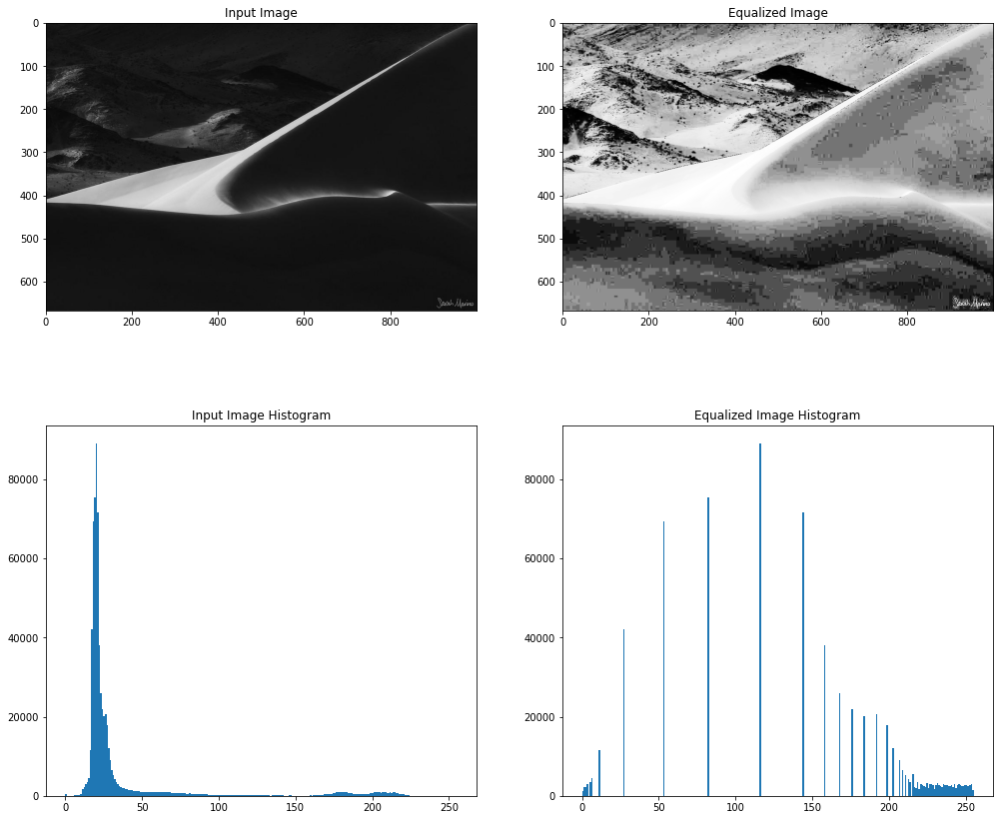

In [36]:
practice_range1 = cv.imread("../images/practice_range1.jpg", cv.IMREAD_GRAYSCALE)
pr1_op, _ = histEqualization(practice_range1)

plt.imsave("../images/practice_range1_equalization_output.png", pr1_op, cmap="gray")

fig = plt.figure(figsize=(17,15))
plt.subplot(221)
plt.imshow(practice_range1, cmap="gray")
plt.title("Input Image")

plt.subplot(222)
plt.imshow(pr1_op, cmap="gray")
plt.title("Equalized Image")

plt.subplot(223)
plt.hist(practice_range1.flatten(), bins=256)
plt.title("Input Image Histogram")

plt.subplot(224)
plt.hist(pr1_op.flatten(), bins=256)
plt.title("Equalized Image Histogram")
print()

#### histEqualization on `hist.jpg`

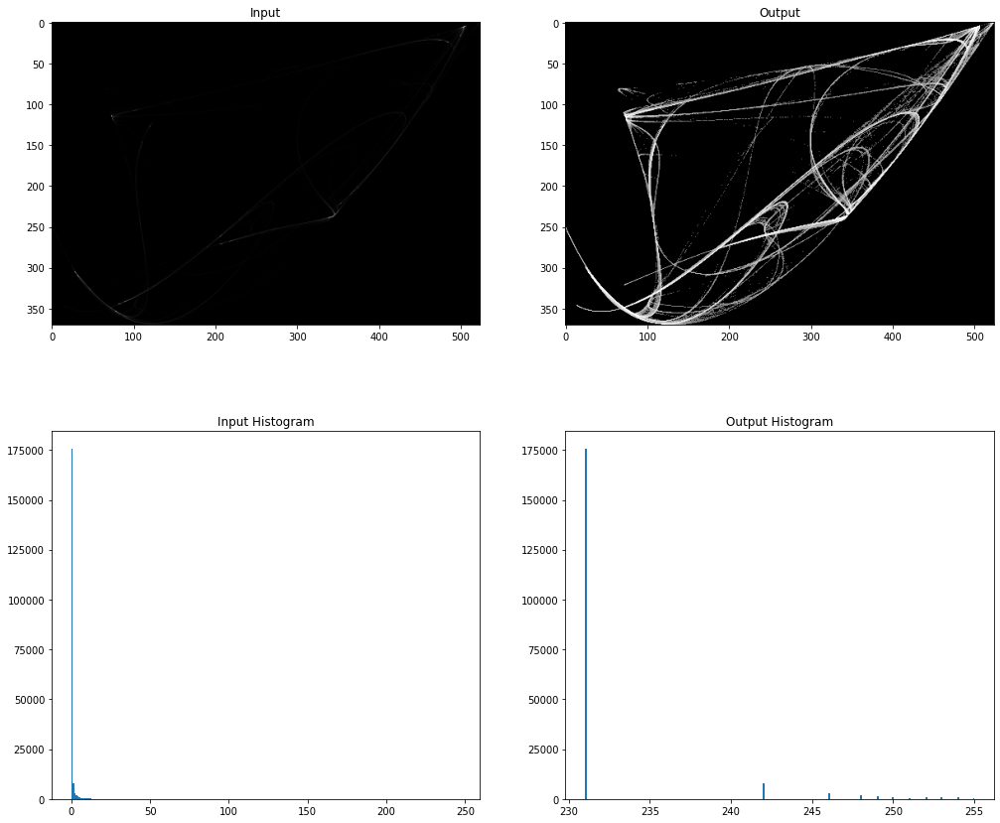

In [37]:
hist_im = cv.imread("../images/hist.png", cv.IMREAD_GRAYSCALE)
hist_im_op, _ = histEqualization(hist_im)

plt.imsave("../images/hist_equalization_output.png", hist_im_op, cmap="gray")

fig = plt.figure(figsize=(17,15))
plt.subplot(221)
plt.imshow(hist_im, cmap="gray")
plt.title("Input")
plt.subplot(222)
plt.imshow(hist_im_op, cmap="gray")
plt.title("Output")
plt.subplot(223)
plt.hist(hist_im.flatten(), bins=256)
plt.title("Input Histogram")
plt.subplot(224)
plt.hist(hist_im_op.flatten(), bins=256)
plt.title("Output Histogram")
print()

### HistMatching on `Map.jpg`

In [38]:
mp = cv.imread("../images/Map.jpg", cv.IMREAD_GRAYSCALE)
satellite_mp = cv.imread("../images/satellite_img.jpg", cv.IMREAD_GRAYSCALE)

#### Displaying Input Images `Map.jpg` and `satellite_img.jpg`

Text(0.5, 1.0, 'Satellite Map')

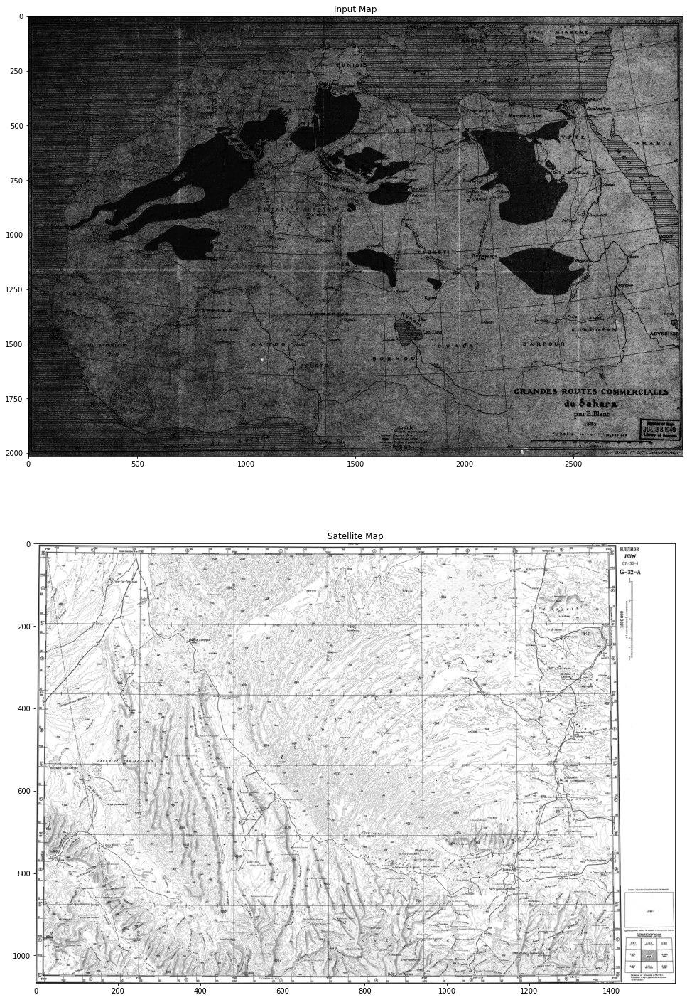

In [39]:
fig = plt.figure(figsize=(30,25))
plt.subplot(211)
plt.imshow(mp, cmap="gray")
plt.title("Input Map")
plt.subplot(212)
plt.imshow(satellite_mp, cmap="gray")
plt.title("Satellite Map")

**`Performing Histogram Matching`**

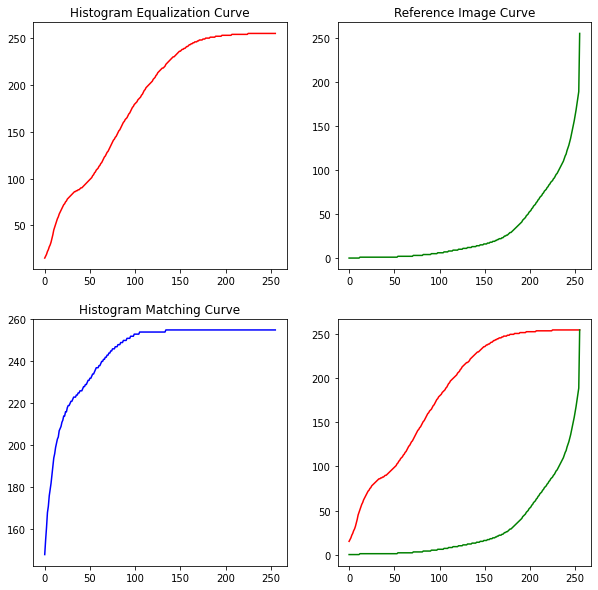

In [40]:
mp_histmatched = histMatching(mp, satellite_mp)

#### Displaying the matched output

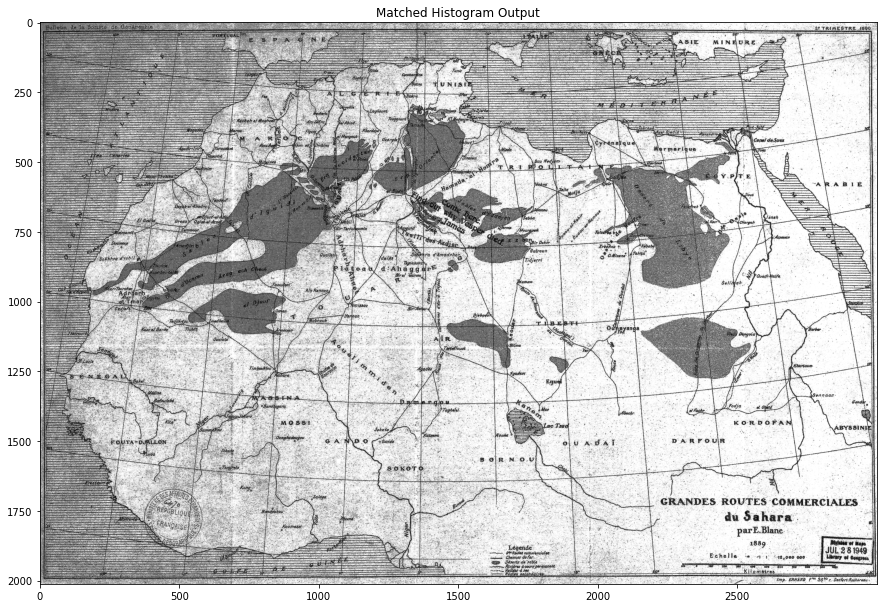

In [41]:
fig = plt.figure(figsize=(15,15))
plt.imshow(mp_histmatched,cmap="gray")
plt.title("Matched Histogram Output")
plt.imsave("../images/q6_map_histmatched-output.png", mp_histmatched, cmap="gray")

**`The name in the map is Vesper`**

Plotting the Histogram for the input, reference and output,

Text(0.5, 1.0, 'Matched Image Histogram')

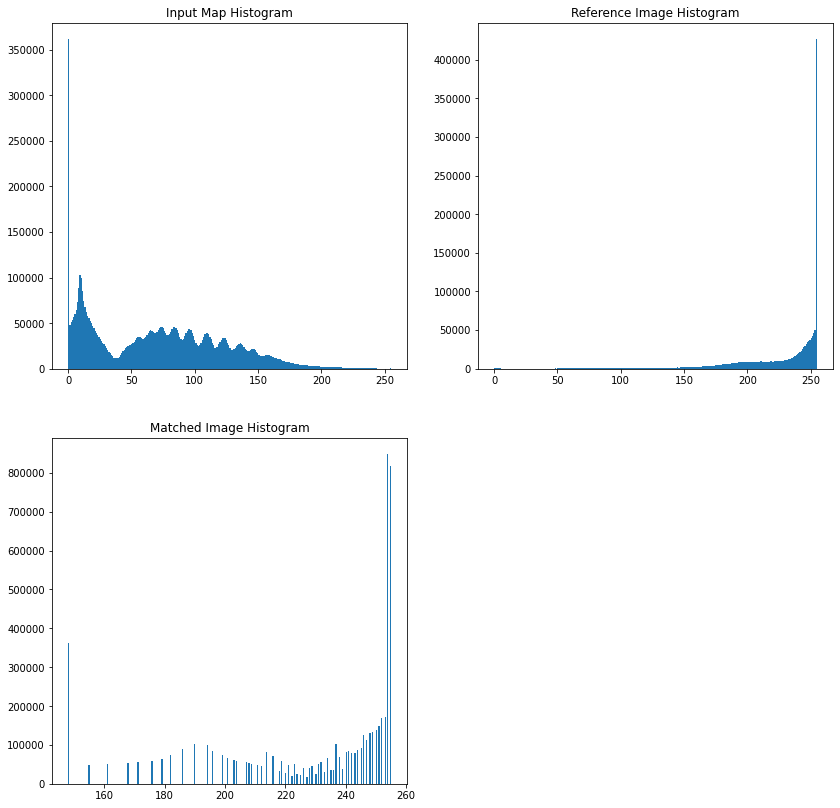

In [42]:
fig = plt.figure(figsize=(14,14))
plt.subplot(221)
plt.hist(mp.flatten(), bins=256)
plt.title("Input Map Histogram")
plt.subplot(222)
plt.hist(satellite_mp.flatten(), bins=256)
plt.title("Reference Image Histogram")
plt.subplot(223)
plt.hist(mp_histmatched.flatten(), bins=256)
plt.title("Matched Image Histogram")

<hr>

## Q7)

#### `piecewiseLinTransform()`

* This function takes in the image, a list K, and a list intervals as parameters
* `K` is a 2D array of the form K = [[$K_{01}$, $K_{02}$], [$K_{11}$, $K_{12}$], ..., [$K_{i1}$, $K_{i2}$]]
* `intervals` is a 2D array of the form intervals = [[$a_{0}$, $b_{0}$], [$a_{1}$, $b_{1}$], ..., [$a{i}$, $b_{i}$]]
* For each pixel in the image, the function finds which interval the intensity of the pixel belongs to, and applies the corresponding transformation using the $K$'s defines for that interval
* The transformation in interval $j$ is defined as $T(x) = K_{j1}*x + K_{j2}$

#### `plot_piecewise()`

* This is a helper function to plot the piecewise function constructed by $K$ and $intervals$, which is used to verify if the correct piecewise function was specified

In [43]:
def piecewiseLinTransform(im, K, intervals):
    
    im = im/255.0
    shp = im.shape
    im = im.flatten()
    
    for i in range(len(im)):
        curr_interval = 0
        for j in range(len(intervals)):
            if intervals[j][0] <= im[i] and im[i]  <= intervals[j][1]:
                curr_interval = j
                break
        im[i] = K[curr_interval][0]*im[i] + K[curr_interval][1]
    
    return (np.reshape(np.array(im), shp)*255).astype('uint8')

def plot_piecewise(K, intervals):
    
    res = 1000
    x = [i/res for i in range(0, res)] + [1.0]
    y = []
    
    c_int = 0
    for i in x:
        
        if c_int != len(intervals)-1 and i >= intervals[c_int+1][0]:
            c_int += 1
        
        y += [K[c_int][0]*i + K[c_int][1]]
    
    plt.plot(x, y)    

### Applying to `bondvillain1.jpg`

In [44]:
bondvillain1 = cv.imread("../images/bondvillain1.jpg", cv.IMREAD_GRAYSCALE)

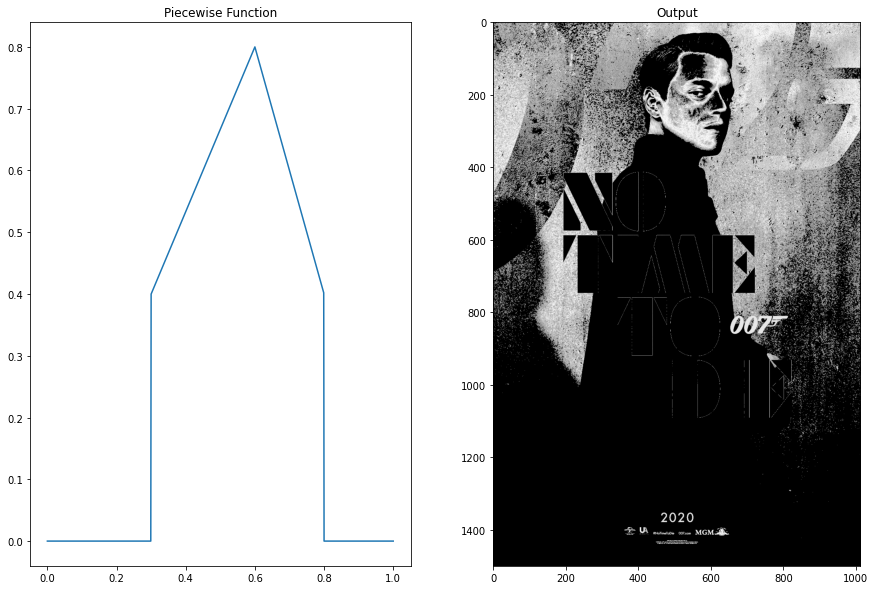

In [45]:
K = [
    [0.0,0.0],
    [1.333,0.0],
    [-2.00,2.0],
    [0.0,0.0]
    ]
intervals = [
    [0.0, 0.3],
    [0.3, 0.6],
    [0.6, 0.8],
    [0.8, 1.0]
]

fig = plt.figure(figsize=(15,10))

plt.subplot(121)
plot_piecewise(K, intervals)
plt.title("Piecewise Function")

plt.subplot(122)
pcw_op = piecewiseLinTransform(bondvillain1, K, intervals)
plt.title("Output")
plt.imshow(pcw_op, cmap="gray")
plt.imsave("../images/piecewise-bondvillain1-output.png", pcw_op, cmap="gray")

### Applying to `bondvillain2.jpg`

In [46]:
bondvillain2 = cv.imread("../images/bondvillain2.jpg", cv.IMREAD_GRAYSCALE)

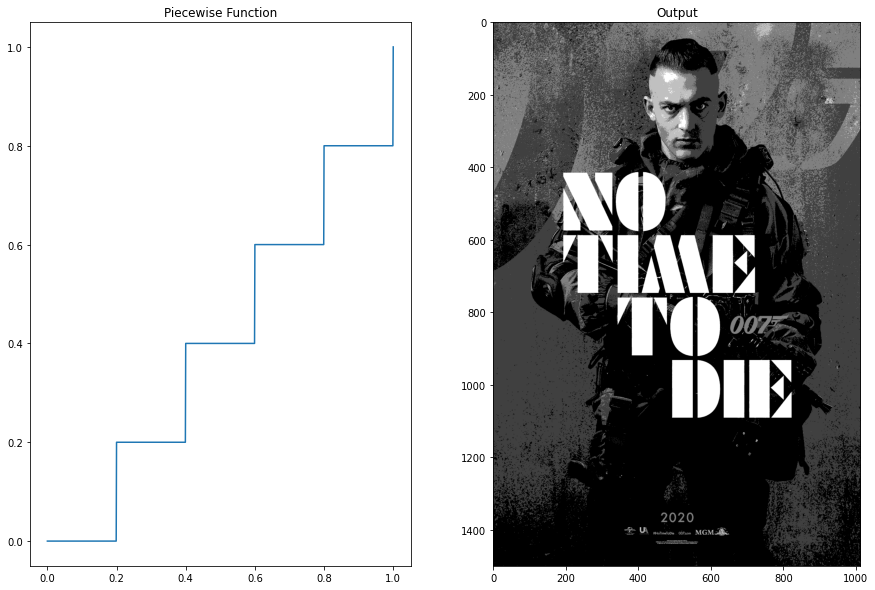

In [47]:
K = [
    [0.0,0.0],
    [0.0,0.2],
    [0.0,0.4],
    [0.0,0.6],
    [0.0,0.8],
    [0.0,1.0]
]
intervals = [
    [0.0, 0.2],
    [0.2, 0.4],
    [0.4, 0.6],
    [0.6, 0.8],
    [0.8, 1.0],
    [1.0, 1.0]
]

fig = plt.figure(figsize=(15,10))

plt.subplot(121)
plot_piecewise(K, intervals)
plt.title("Piecewise Function")

plt.subplot(122)
pcw_op = piecewiseLinTransform(bondvillain2, K, intervals)
plt.title("Output")

plt.imshow(pcw_op, cmap="gray")
plt.imsave("../images/piecewise-bondvillain2-output.png", pcw_op, cmap="gray")

### Applying to `stormtrooper.jpg` (Custom Input)

In [48]:
strooper = cv.imread("../images/stormtrooper.jpg", cv.IMREAD_GRAYSCALE)

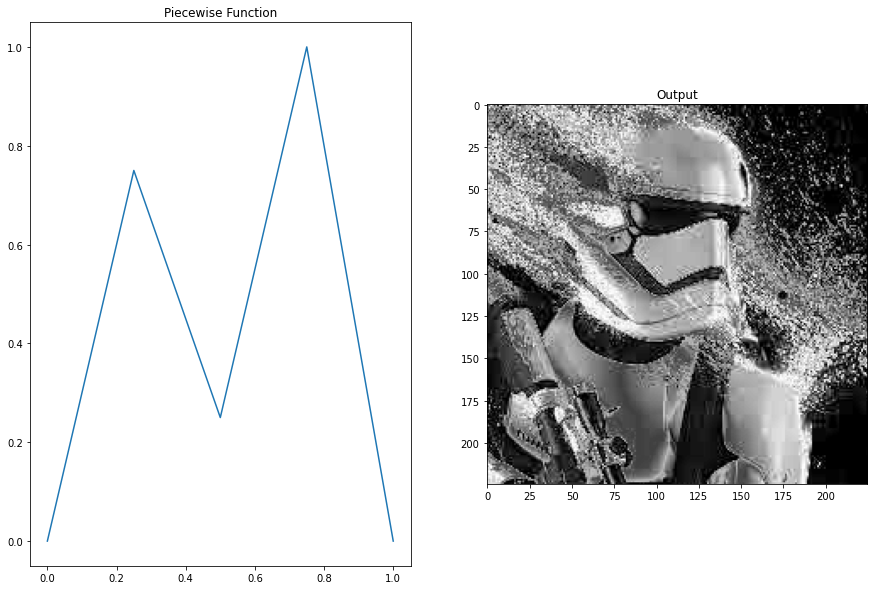

In [49]:
K = [
    [3.0, 0.0],
    [-2.0, 1.25],
    [3.0, -1.25],
    [-4.0, +4.0],
    
    ]
intervals = [
    [0.0, 0.25],
    [0.25, 0.5],
    [0.5, 0.75],
    [0.75, 1.0]
]

fig = plt.figure(figsize=(15,10))

plt.subplot(121)
plot_piecewise(K, intervals)
plt.title("Piecewise Function")

plt.subplot(122)
pcw_op = piecewiseLinTransform(strooper, K, intervals)
plt.title("Output")
plt.imshow(pcw_op, cmap="gray")
plt.imsave("../images/piecewise-custom-output.png", pcw_op, cmap="gray")

<hr>

## Difference in Piecewise Linear Transform of `bondvillain1.jpg` and `bondvillain2.jpg`

* We notice that the text in the tranform of `bondvillain1.jpg`, the text gets darkened and looks as if it has gone behind the person.
* Meanwhile, in the transform of `bondvillain2.jpg`, the text remains in the foreground, and stays in front of the person.

This is because in the first piecewise function, we map all intensities > 0.8, ie. strongly white intensities to 0
In the second piecewise function, we map the strongly white intensities to 0.8, and complete white to 1.0, which is why it still appears white

<hr>

## Q8)

### `gammaTransform()`
* This function takes in the image, $c$ and $\gamma$ as input
* The formula used is: $s = c*r^\gamma$, where r is the input intensity, and s is the output intensity

In [50]:
def gammaTransform(im, c, gamma):
    
    im = im/255.
    new = np.clip(c*(im**gamma), 0.0, 1.0)
    
    return (new*255).astype('uint8')

### Applying `gammaTransform()` on `stealth.png`

In [51]:
stealth = cv.imread("../images/stealth.png")
stealth = cv.cvtColor(stealth, cv.COLOR_BGR2GRAY)

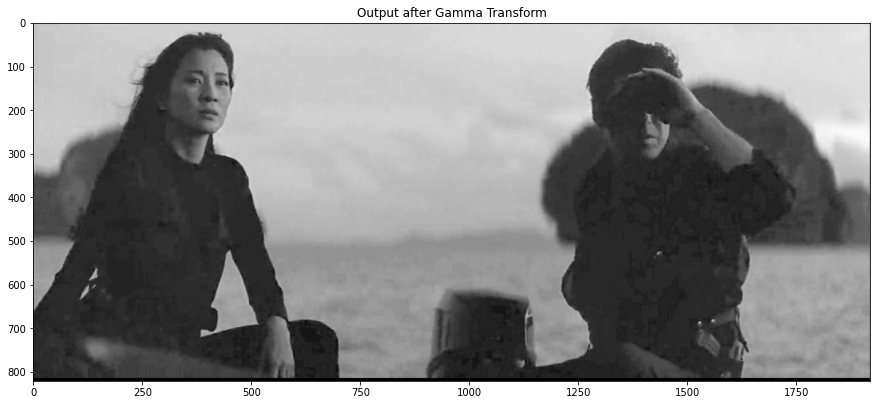

In [52]:
gamma_stealth = gammaTransform(stealth, 1, 0.6)
fig = plt.figure(figsize=(15,12))
plt.imshow(gamma_stealth, cmap="gray")
plt.title("Output after Gamma Transform")
plt.imsave("../images/gamma_stealth_output.png", gamma_stealth, cmap="gray")

### $\gamma$ value used = 0.6

<hr>

### Applying `gammaTransform()` on `unstealth.png`

In [53]:
unstealth = cv.imread("../images/unstealth.png")
unstealth = cv.cvtColor(unstealth, cv.COLOR_BGR2GRAY)

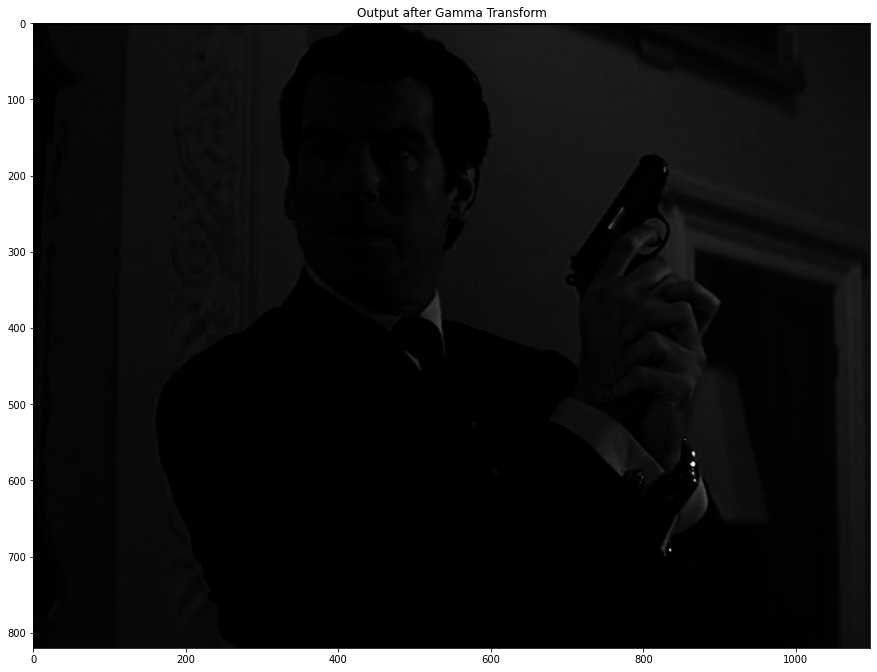

In [54]:
gamma_unstealth = gammaTransform(unstealth, 1, 2.5)
fig = plt.figure(figsize=(15,12))
plt.imshow(gamma_unstealth, cmap="gray")
plt.title("Output after Gamma Transform")
plt.imsave("../images/gamma_unstealth_output.png", gamma_unstealth, cmap="gray")

### $\gamma$ value used = 2.5

<hr>

### Applying `gammaTransform()` on `aston_invisible.jpg`

In [55]:
aston = cv.imread("../images/aston_invisible.jpg", cv.IMREAD_GRAYSCALE)

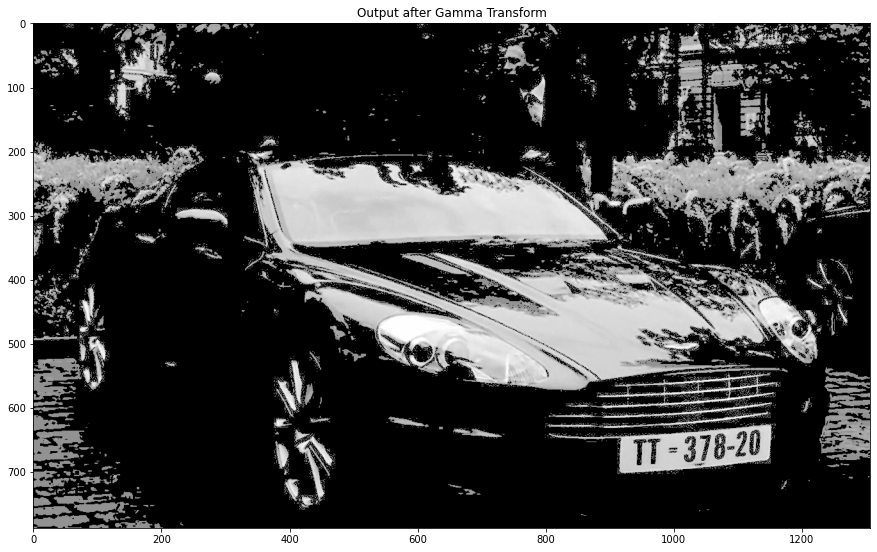

In [56]:
clear_aston = gammaTransform(aston, 0.9, 0.1)
fig = plt.figure(figsize=(15,12))
plt.imshow(clear_aston, cmap="gray")
plt.title("Output after Gamma Transform")
plt.imsave("../images/aston_invisible_output.png", clear_aston, cmap="gray")

### The plate number of the car is `TT 378-20`

### $\gamma$ value used = 0.1

<hr>

## Q9)

### Reading the 4 images,

In [57]:
j1 = cv.imread("../images/james1.jpg", cv.IMREAD_GRAYSCALE)
j2 = cv.imread("../images/james2.jpg", cv.IMREAD_GRAYSCALE)
j3 = cv.imread("../images/james3.jpg", cv.IMREAD_GRAYSCALE)
j4 = cv.imread("../images/james4.jpg", cv.IMREAD_GRAYSCALE)

# setting the output to be input initially
j1_o = j1
j2_o = j2
j3_o = j3
j4_o = j4

### Transformations Applied:

#### `James1.jpg`
* Gamma Transform: $c = 1, \gamma = 1.1$

#### `James2.jpg`
* Histogram Matching: *Reference Image*: `James1.jpg`
* Linear Constrast Stetching: $a = -20, b = 255$
* Gamma Transform: $c = 1.0, \gamma = 1.8$

#### `James3.jpg`
* Linear Constrast Stetching: $a = -40, b = 255$
* Gamma Transform: $c = 1.0, \gamma = 2.2$

#### `James4.jpg`
* Linear Constrast Stetching: $a = 0, b = 255$
* Gamma Transform: $c = 1.0, \gamma = 1.85$
* Gamma Transform: $c = 1.0, \gamma = 2.8$

Text(0.5, 1.0, 'Input')

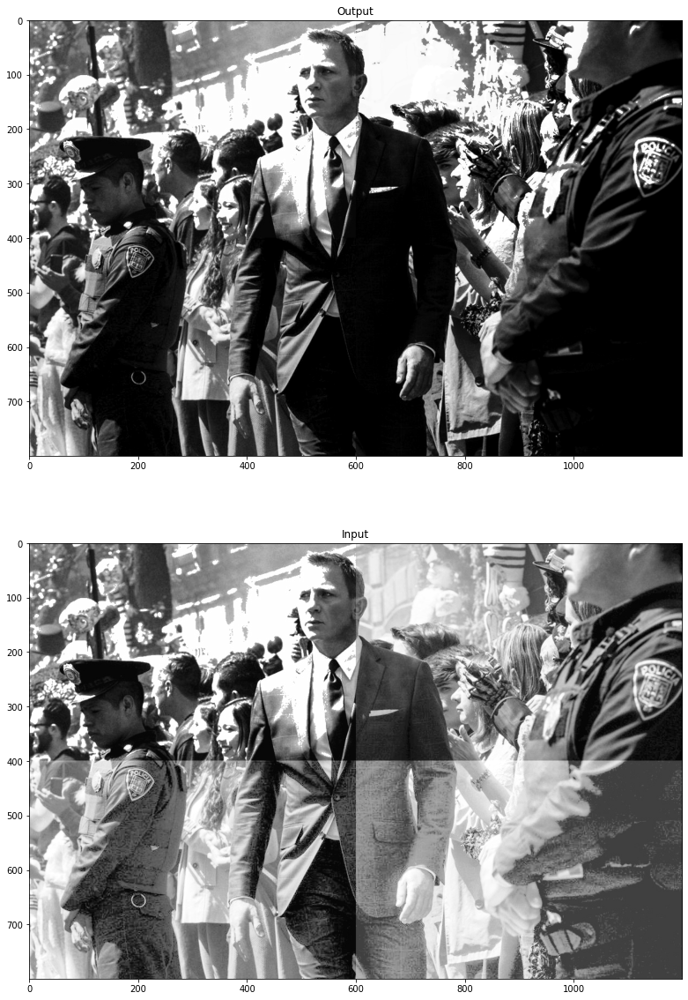

In [58]:
j1_o = gammaTransform(j1_o, 1.0, 1.1)

j2_o= histMatching(j2, j1, plot=False)
j2_o = linContrastStretching(j2_o, -20, 255, show=False)
j2_o = gammaTransform(j2_o, 1.0, 1.8)

j3_o = linContrastStretching(j3, -40, 255, show=False)
j3_o = gammaTransform(j3_o, 1.0, 2.2)

j4_o = linContrastStretching(j4, 0, 255, show=False)
j4_o = gammaTransform(j4_o, 1.0, 1.85)
j4_o = gammaTransform(j4_o, 1.0, 2.8)

final_inp = np.vstack([np.hstack([j1,j2]), np.hstack([j3,j4])])
final = np.vstack([np.hstack([j1_o,j2_o]), np.hstack([j3_o,j4_o])])

plt.imsave("../images/final_q9.png", final, cmap="gray")

fig = plt.figure(figsize=(18,20))
plt.subplot(211)
plt.imshow(final, cmap="gray", vmin=0, vmax=255)
plt.title("Output")
plt.subplot(212)
plt.imshow(final_inp, cmap="gray")
plt.title("Input")